In [1]:
import os
import os.path as osp
from pathlib import Path
import cv2
import numpy as np
from matplotlib import pyplot as plt

__file__ = os.path.abspath('')

project_dir = Path(__file__).resolve()

# print(project_dir)


p_dn = Path(str(project_dir) + '/../data/raw/dn').resolve()
p_pc = Path(str(project_dir) + '/../data/raw/pc').resolve()

In [2]:
def getLBPimage(image):
    '''
    == Input ==
    gray_image  : color image of shape (height, width)
    
    == Output ==  
    imgLBP : LBP converted image of the same shape as 
    '''
    
    ### Step 0: Step 0: Convert an image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    imgLBP = np.zeros_like(gray_image)
    neighboor = 3 
    for ih in range(0,image.shape[0] - neighboor):
        for iw in range(0,image.shape[1] - neighboor):
            ### Step 1: 3 by 3 pixel
            img          = gray_image[ih:ih+neighboor,iw:iw+neighboor]
            center       = img[1,1]
            img01        = (img >= center)*1.0
            img01_vector = img01.T.flatten()
            # it is ok to order counterclock manner
            # img01_vector = img01.flatten()
            ### Step 2: **Binary operation**:
            img01_vector = np.delete(img01_vector,4)
            ### Step 3: Decimal: Convert the binary operated values to a digit.
            where_img01_vector = np.where(img01_vector)[0]
            if len(where_img01_vector) >= 1:
                num = np.sum(2**where_img01_vector)
            else:
                num = 0
            imgLBP[ih+1,iw+1] = num
    return(imgLBP)

In [3]:
# dir_images = p_dn
def lbp_hisogram(dir_images):
    imgs = os.listdir(dir_images)
    for imgnm in imgs:
    #     image = plt.imread(os.path.join(dir_images,imgnm))
        image = cv2.imread(os.path.join(dir_images,imgnm))

        imgLBP    = getLBPimage(image)
        vecimgLBP = imgLBP.flatten()

        fig = plt.figure(figsize=(20,8))
        ax  = fig.add_subplot(1,3,1)
        ax.imshow(image)
        ax.set_title("gray scale image")
        ax  = fig.add_subplot(1,3,2)
        ax.imshow(imgLBP,cmap="gray")
        ax.set_title("LBP converted image")
        ax  = fig.add_subplot(1,3,3)
        freq,lbp, _ = ax.hist(vecimgLBP,bins=2**8)
        ax.set_ylim(0,100000)
        lbp = lbp[:-1]
        ## print the LBP values when frequencies are high
    #     largeTF = freq > 5000
    #     for x, fr in zip(lbp[largeTF],freq[largeTF]):
    #         ax.text(x,fr, "{:6.0f}".format(x),color="magenta")
        ax.set_title("LBP histogram")
        plt.show()

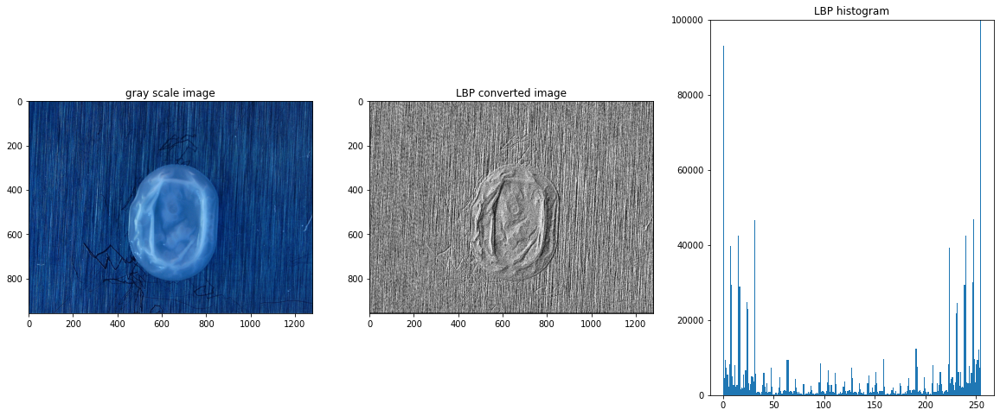

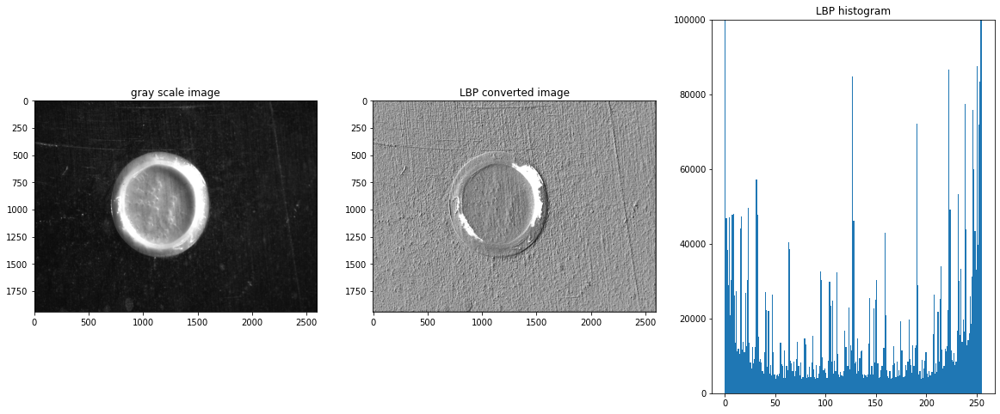

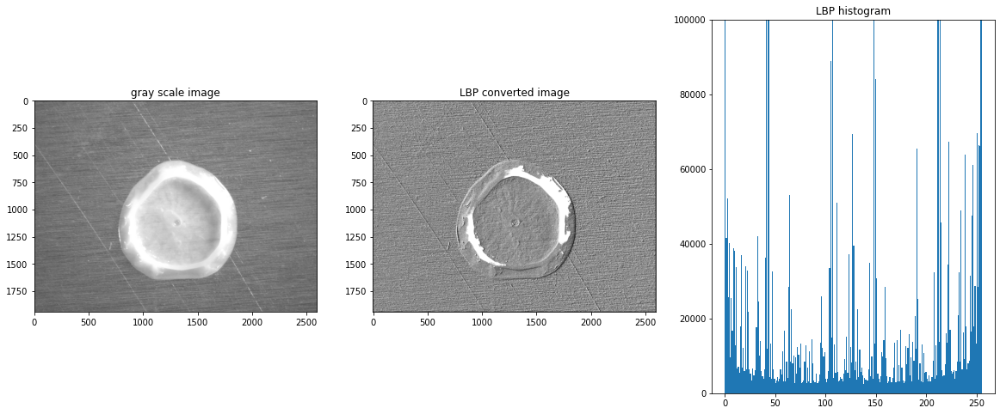

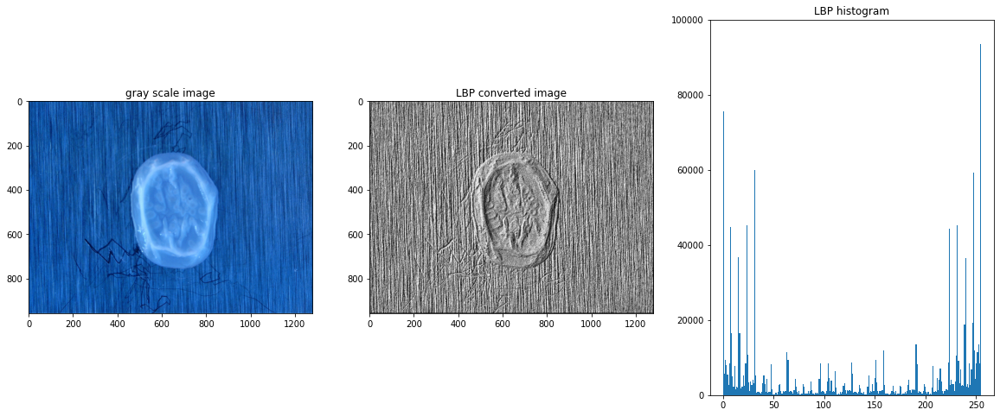

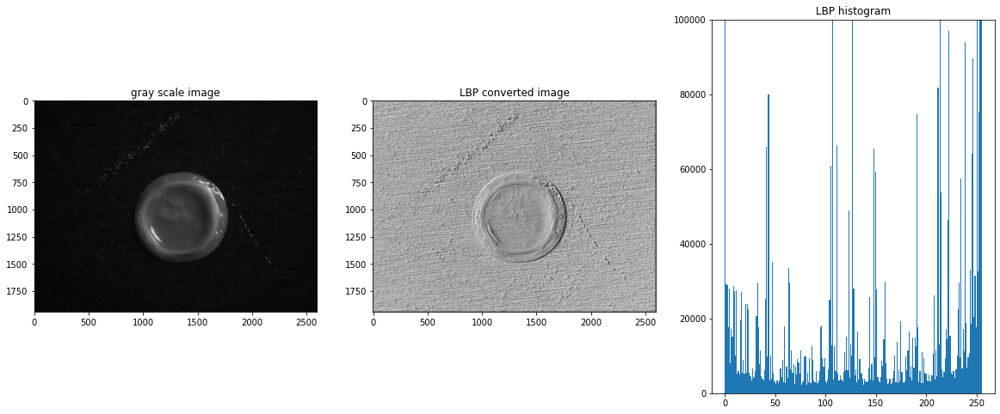

...

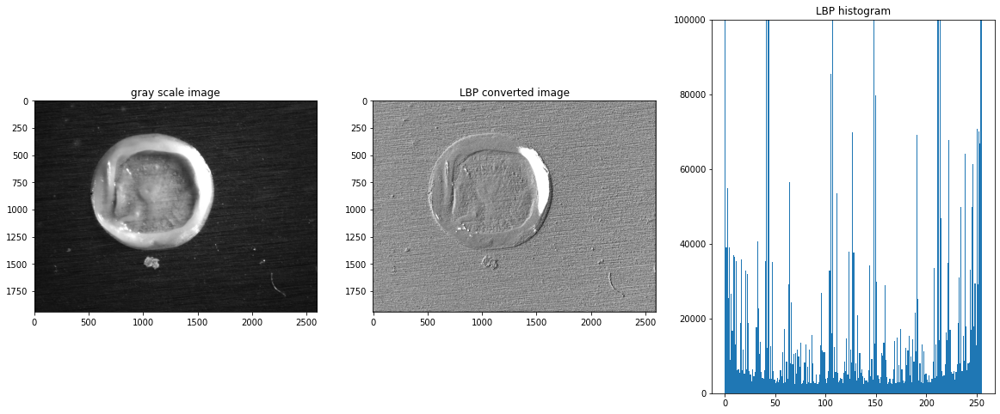

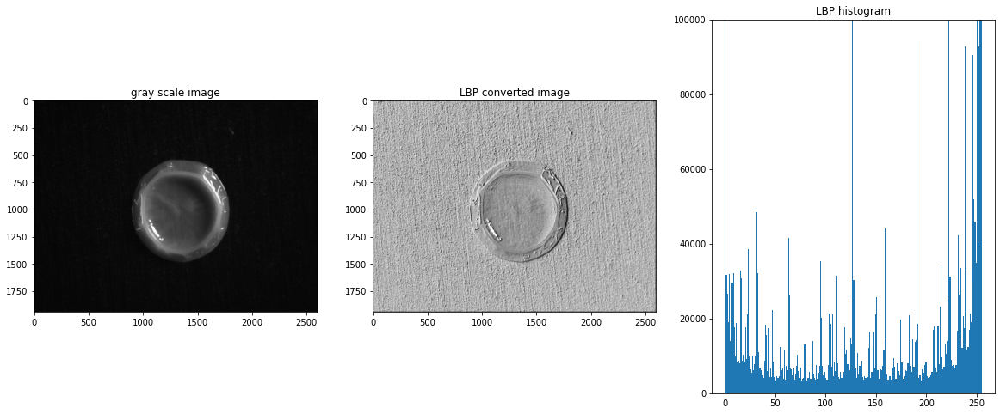

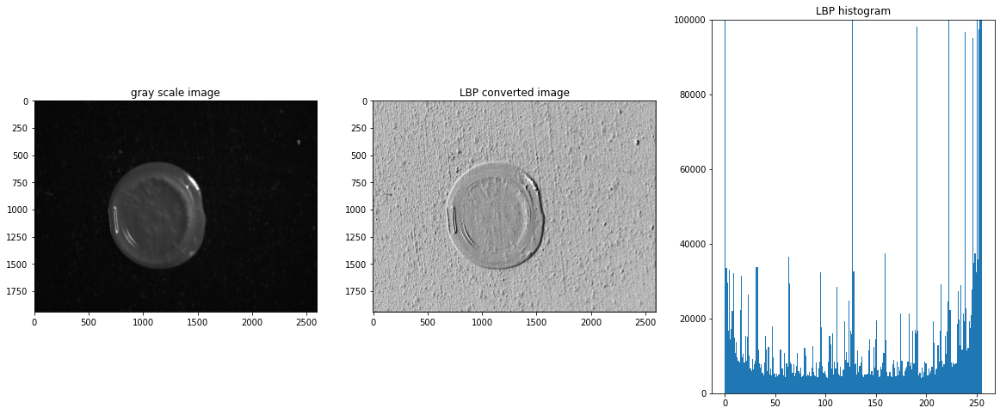

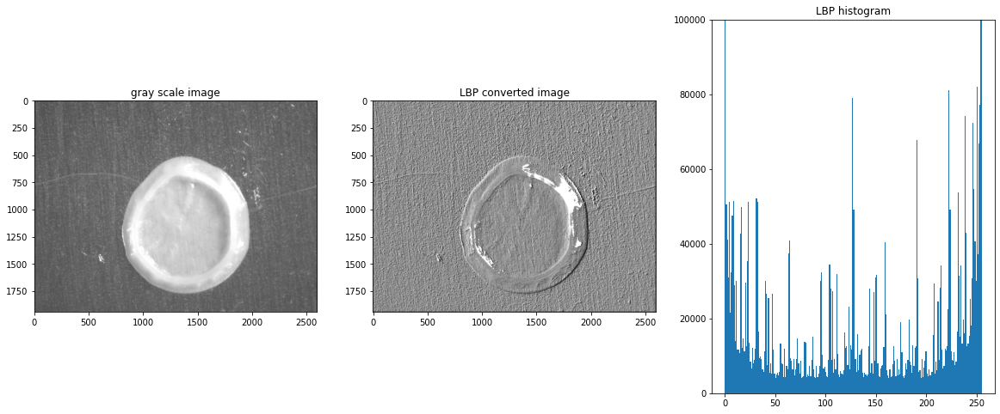

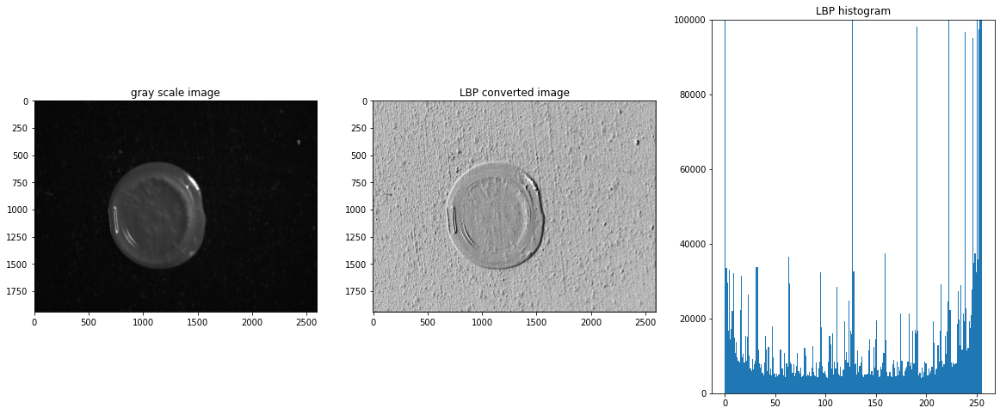

In [4]:
# dir_images = p_dn
lbp_hisogram(p_dn)

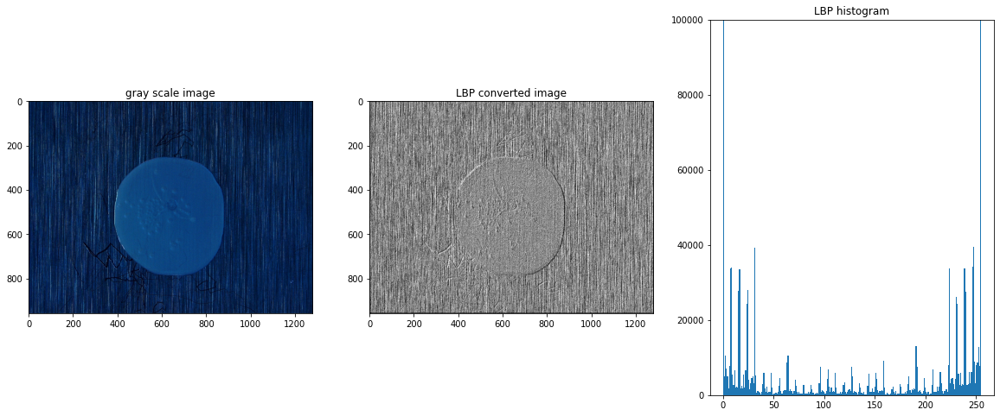

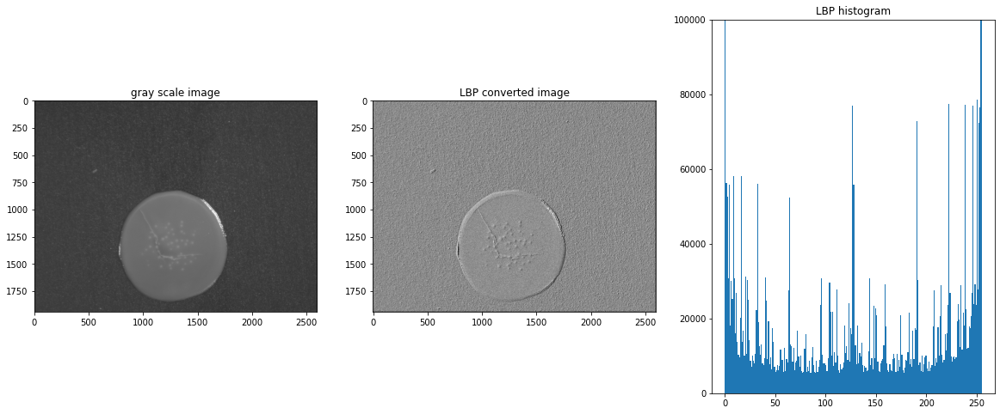

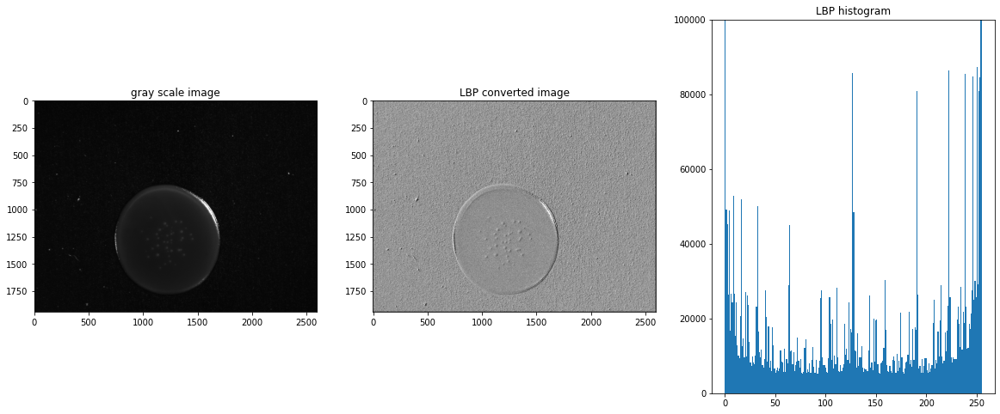

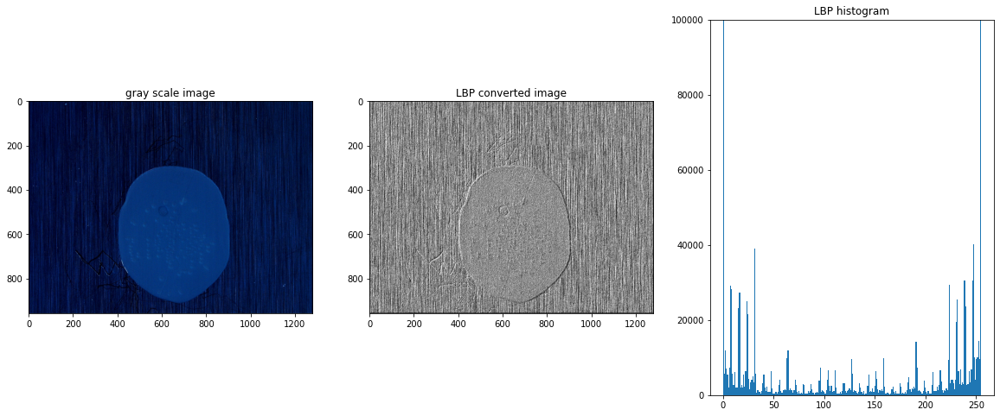

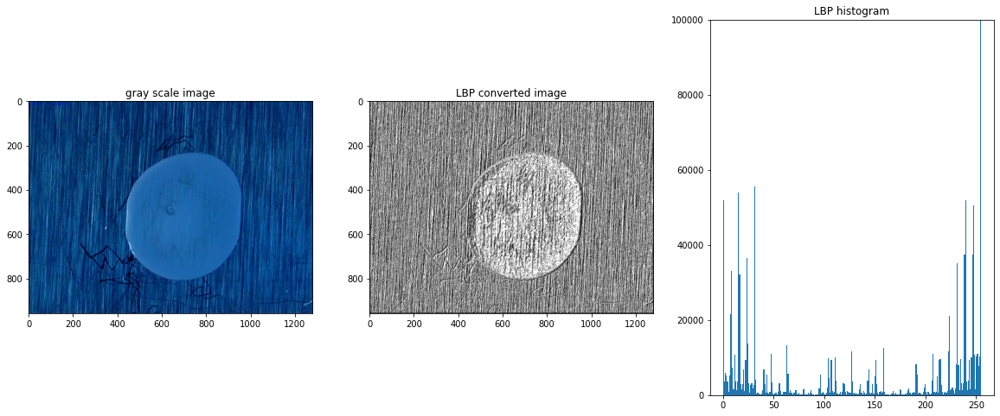

...

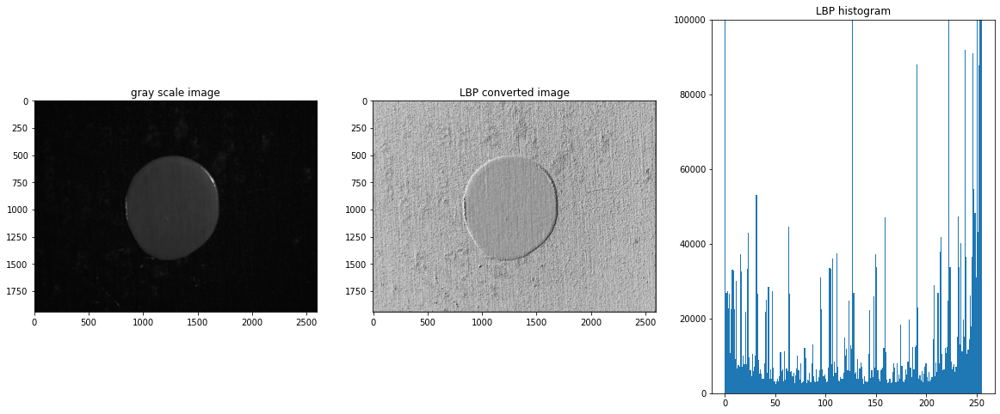

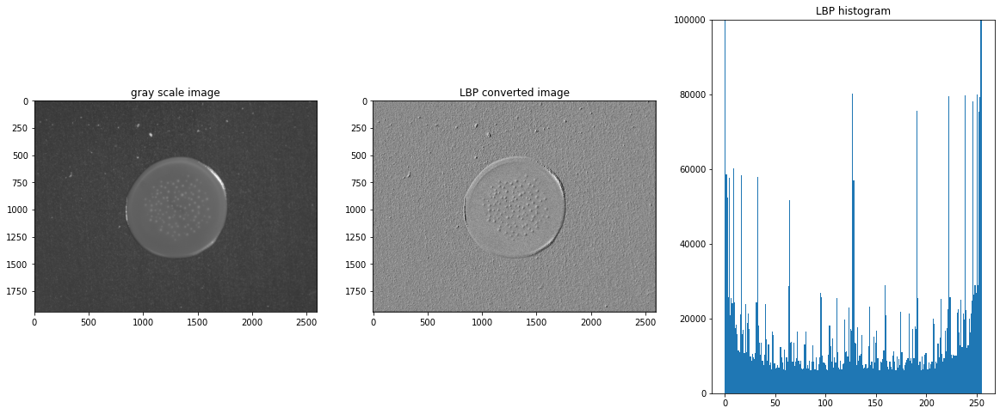

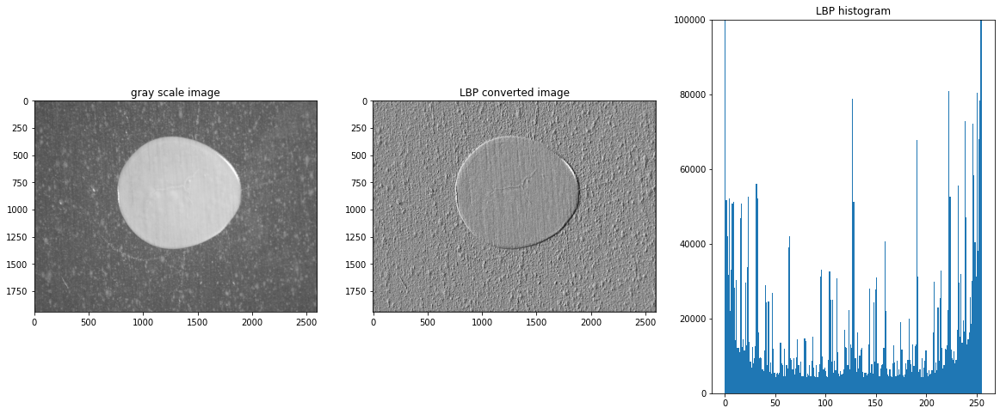

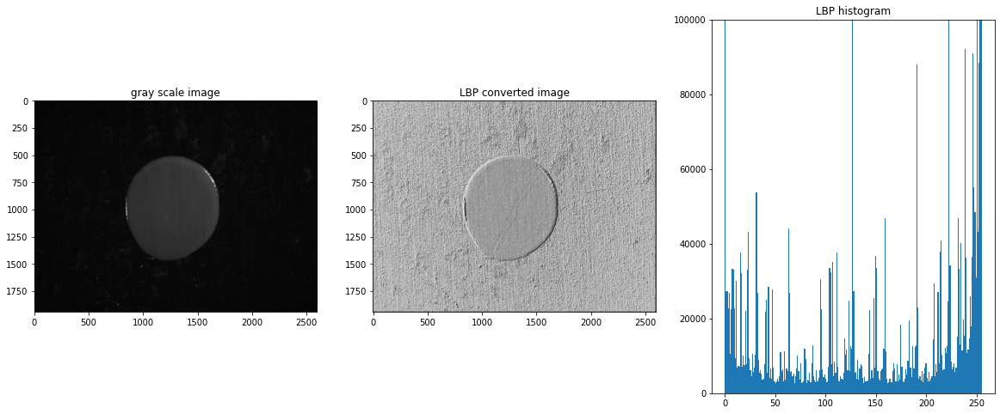

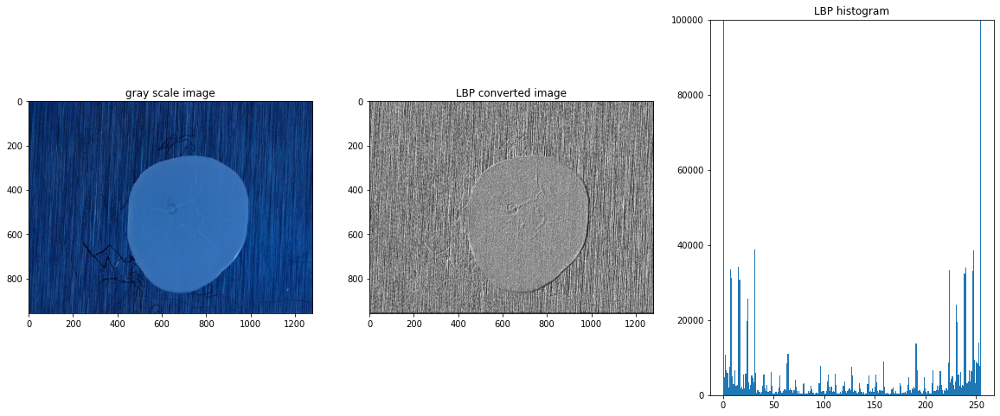

In [5]:
lbp_hisogram(p_pc)